In [16]:

from huggingface_hub import login
from dotenv import load_dotenv
import os


load_dotenv()  # Load environment variables from .env file


hf_token = os.getenv("HF_TOKEN")

login(token=hf_token)


Note: Environment variable`HF_TOKEN` is set and is the current active token independently from the token you've just configured.


In [17]:

# Get Noto JP font to display janapese characters
# !apt-get install fonts-noto-cjk  # For Noto Sans CJK JP

#!apt-get install fonts-source-han-sans-jp # For Source Han Sans (Japanese)

import json
import random
import io
import ast
from PIL import Image, ImageDraw, ImageFont
from PIL import ImageColor
import xml.etree.ElementTree as ET

additional_colors = [colorname for (colorname, colorcode) in ImageColor.colormap.items()]

def decode_xml_points(text):
    try:
        root = ET.fromstring(text)
        num_points = (len(root.attrib) - 1) // 2
        points = []
        for i in range(num_points):
            x = root.attrib.get(f'x{i+1}')
            y = root.attrib.get(f'y{i+1}')
            points.append([x, y])
        alt = root.attrib.get('alt')
        phrase = root.text.strip() if root.text else None
        return {
            "points": points,
            "alt": alt,
            "phrase": phrase
        }
    except Exception as e:
        print(e)
        return None

def plot_bounding_boxes(im, bounding_boxes, input_width, input_height):
    """
    Plots bounding boxes on an image with markers for each a name, using PIL, normalized coordinates, and different colors.

    Args:
        img_path: The path to the image file.
        bounding_boxes: A list of bounding boxes containing the name of the object
         and their positions in normalized [y1 x1 y2 x2] format.
    """

    # Load the image
    img = im
    width, height = img.size
    print(img.size)
    # Create a drawing object
    draw = ImageDraw.Draw(img)

    # Define a list of colors
    colors = [
    'red',
    'green',
    'blue',
    'yellow',
    'orange',
    'pink',
    'purple',
    'brown',
    'gray',
    'beige',
    'turquoise',
    'cyan',
    'magenta',
    'lime',
    'navy',
    'maroon',
    'teal',
    'olive',
    'coral',
    'lavender',
    'violet',
    'gold',
    'silver',
    ] + additional_colors

    # Parsing out the markdown fencing
    bounding_boxes = parse_json(bounding_boxes)

    font = ImageFont.truetype("NotoSansCJK-Regular.ttc", size=14)

    try:
      json_output = ast.literal_eval(bounding_boxes)
    except Exception as e:
      end_idx = bounding_boxes.rfind('"}') + len('"}')
      truncated_text = bounding_boxes[:end_idx] + "]"
      json_output = ast.literal_eval(truncated_text)

    # Iterate over the bounding boxes
    for i, bounding_box in enumerate(json_output):
      # Select a color from the list
      color = colors[i % len(colors)]

      # Convert normalized coordinates to absolute coordinates
      abs_y1 = int(bounding_box["bbox_2d"][1]/input_height * height)
      abs_x1 = int(bounding_box["bbox_2d"][0]/input_width * width)
      abs_y2 = int(bounding_box["bbox_2d"][3]/input_height * height)
      abs_x2 = int(bounding_box["bbox_2d"][2]/input_width * width)

      if abs_x1 > abs_x2:
        abs_x1, abs_x2 = abs_x2, abs_x1

      if abs_y1 > abs_y2:
        abs_y1, abs_y2 = abs_y2, abs_y1

      # Draw the bounding box
      draw.rectangle(
          ((abs_x1, abs_y1), (abs_x2, abs_y2)), outline=color, width=4
      )

      # Draw the text
      if "label" in bounding_box:
        draw.text((abs_x1 + 8, abs_y1 + 6), bounding_box["label"], fill=color, font=font)

    # Display the image
    img.show()


def plot_points(im, text, input_width, input_height):
  img = im
  width, height = img.size
  draw = ImageDraw.Draw(img)
  colors = [
    'red', 'green', 'blue', 'yellow', 'orange', 'pink', 'purple', 'brown', 'gray',
    'beige', 'turquoise', 'cyan', 'magenta', 'lime', 'navy', 'maroon', 'teal',
    'olive', 'coral', 'lavender', 'violet', 'gold', 'silver',
  ] + additional_colors
  xml_text = text.replace('```xml', '')
  xml_text = xml_text.replace('```', '')
  data = decode_xml_points(xml_text)
  if data is None:
    img.show()
    return
  points = data['points']
  description = data['phrase']

  font = ImageFont.truetype("NotoSansCJK-Regular.ttc", size=14)

  for i, point in enumerate(points):
    color = colors[i % len(colors)]
    abs_x1 = int(point[0])/input_width * width
    abs_y1 = int(point[1])/input_height * height
    radius = 2
    draw.ellipse([(abs_x1 - radius, abs_y1 - radius), (abs_x1 + radius, abs_y1 + radius)], fill=color)
    draw.text((abs_x1 + 8, abs_y1 + 6), description, fill=color, font=font)
  
  img.show()
  

# @title Parsing JSON output
def parse_json(json_output):
    # Parsing out the markdown fencing
    lines = json_output.splitlines()
    for i, line in enumerate(lines):
        if line == "```json":
            json_output = "\n".join(lines[i+1:])  # Remove everything before "```json"
            json_output = json_output.split("```")[0]  # Remove everything after the closing "```"
            break  # Exit the loop once "```json" is found
    return json_output

In [27]:
from PIL import Image, ImageDraw, ImageFont
import ast
import numpy as np
import re
from IPython.display import display


def parse_json(bounding_boxes,caption):
    # print(type(bounding_boxes))
    # Handles both literal JSON-style strings and simple float arrays
    if isinstance(bounding_boxes, str):
        # Detect float array style: '[num num num num]'
        float_array_match = re.findall(r"[-+]?\d*\.\d+|\d+", bounding_boxes)
        if float_array_match and len(float_array_match) == 4:
            # Convert to float, reshape and wrap in dict with dummy label
            coords = list(map(float, float_array_match))
            return [{"bbox_2d": coords, "label": caption}]
        else:
            try:
                return ast.literal_eval(bounding_boxes)
            except Exception as e:
                end_idx = bounding_boxes.rfind('"}') + len('"}')
                truncated_text = bounding_boxes[:end_idx] + "]"
                return ast.literal_eval(truncated_text)
    return bounding_boxes

def plot_bounding_boxes(im, bounding_boxes, caption, input_width=None, input_height=None):
    from PIL import ImageDraw, ImageFont

    img = im
    width, height = img.size
    draw = ImageDraw.Draw(img)

    # Define colors
    colors = [
        'red', 'green', 'blue', 'yellow', 'orange', 'pink', 'purple', 'brown',
        'gray', 'beige', 'turquoise', 'cyan', 'magenta', 'lime', 'navy',
        'maroon', 'teal', 'olive', 'coral', 'lavender', 'violet', 'gold',
        'silver'
    ]

    try:
        font = ImageFont.truetype("NotoSansCJK-Regular.ttc", size=14)
    except OSError:
        # print("Font not found. Falling back to default.")
        font = ImageFont.load_default()

    parsed_boxes = parse_json(bounding_boxes,caption)
    # print(parsed_boxes)

    for i, bounding_box in enumerate(parsed_boxes):
        color = colors[i % len(colors)]

        y1, x1, y2, x2 = bounding_box["bbox_2d"]
        # print("====\n",bounding_box)
        # y1, x1, y2, x2 = bounding_box
        
        if input_height and input_width:
            abs_y1 = int(y1 / input_height * height)
            abs_x1 = int(x1 / input_width * width)
            abs_y2 = int(y2 / input_height * height)
            abs_x2 = int(x2 / input_width * width)

        else: 
            abs_y1 = y1
            abs_x1 = x1
            abs_y2 = y2
            abs_x2 = x2


        # Ensure proper ordering
        abs_x1, abs_x2 = sorted([abs_x1, abs_x2])
        abs_y1, abs_y2 = sorted([abs_y1, abs_y2])

        draw.rectangle(((abs_x1, abs_y1), (abs_x2, abs_y2)), outline=color, width=4)

        if "label" in bounding_box:
            draw.text((abs_x1 + 8, abs_y1 + 6), bounding_box["label"], fill=color, font=font)

    # Uncomment to display
    display(img)


In [5]:
import os
import io
import pandas as pd
from PIL import Image as Image_PIL
import shutil
from datasets import load_dataset, Dataset, Image
from tqdm import tqdm
from huggingface_hub import login
from dotenv import load_dotenv
import os

load_dotenv()  # Load environment variables from .env file


# --- Configuration ---

hf_token = os.getenv("HF_TOKEN")

hf_user = "Rajarshi-Roy-research"
# dataset_name = "Flickr30k_Grounding_Som"
# commit_message = "Updating dataset with image paths"
# img_cols = ["image","wbox_image"]
# image_to_process = "image"

dataset_name = "lmms-lab-RefCOCO"
commit_message = "Updating dataset with images and depth caption"
img_cols = ["image"]
image_to_process = "image"

# --- Helper Functions ---
def save_image_from_bytes(image_data, idx, image_folder):
    """Saves an image from byte data and returns the saved file path."""
    try:
        image_bytes = image_data.get("bytes", None)
        if image_bytes:
            image = Image_PIL.open(io.BytesIO(image_bytes))
            image_path = os.path.join(image_folder, f"image_{idx}.jpg")
            image.save(image_path, format="JPEG")
            print(f"✅ Saved: {image_path}")
            return image_path
        else:
            print(f"⚠️ Skipped row {idx}: No bytes found")
            return None
    except Exception as e:
        print(f"❌ Error saving image at row {idx}: {e}")
        return None


# --- Main Script ---
# Clean up existing image folder
for img_col in img_cols:
    if os.path.exists(img_col):
        shutil.rmtree(img_col)
    os.makedirs(img_col)

# Load dataset
ds = load_dataset(f"{hf_user}/{dataset_name}")
df = ds["testB"].to_pandas()

for img_col in img_cols:
    # Save images and update DataFrame
    for i, row in df.iterrows():
        if isinstance(row[img_col], dict):
            df.at[i, img_col] = save_image_from_bytes(row[img_col], i, img_col)



✅ Saved: image/image_0.jpg
✅ Saved: image/image_1.jpg
✅ Saved: image/image_2.jpg
✅ Saved: image/image_3.jpg
✅ Saved: image/image_4.jpg
✅ Saved: image/image_5.jpg
✅ Saved: image/image_6.jpg
✅ Saved: image/image_7.jpg
✅ Saved: image/image_8.jpg
✅ Saved: image/image_9.jpg
✅ Saved: image/image_10.jpg
✅ Saved: image/image_11.jpg
✅ Saved: image/image_12.jpg
✅ Saved: image/image_13.jpg
✅ Saved: image/image_14.jpg
✅ Saved: image/image_15.jpg
✅ Saved: image/image_16.jpg
✅ Saved: image/image_17.jpg
✅ Saved: image/image_18.jpg
✅ Saved: image/image_19.jpg
✅ Saved: image/image_20.jpg
✅ Saved: image/image_21.jpg
✅ Saved: image/image_22.jpg
✅ Saved: image/image_23.jpg
✅ Saved: image/image_24.jpg
✅ Saved: image/image_25.jpg
✅ Saved: image/image_26.jpg
✅ Saved: image/image_27.jpg
✅ Saved: image/image_28.jpg
✅ Saved: image/image_29.jpg
✅ Saved: image/image_30.jpg
✅ Saved: image/image_31.jpg
✅ Saved: image/image_32.jpg
✅ Saved: image/image_33.jpg
✅ Saved: image/image_34.jpg
✅ Saved: image/image_35.jpg
✅ 

In [7]:
df

,question_id,image,question,answer,segmentation,bbox,iscrowd,file_name
0,1051327,image/image_0.jpg,Please carefully observe the area circled in t...,"[orange in bowl, top mid orange whole]","[112.94, 46.68, 185.22, 45.18, 215.34, 60.24, ...","[70.78, 45.18, 182.21, 183.71]",0,COCO_train2014_000000316293_3.jpg
1,1122937,image/image_1.jpg,Please carefully observe the area circled in t...,"[stove, stove top, stove top]","[104.99, 488.99, 110.74, 394.07, 151.01, 419.9...","[100.67, 379.69, 379.33, 146.69]",0,COCO_train2014_000000208845_3.jpg
2,1082247,image/image_2.jpg,Please carefully observe the area circled in t...,"[top edge, 3rd donut from right, portion of do...","[140.22, 96.0, 114.34, 60.4, 107.87, 32.36, 10...","[106.79, 2.16, 155.32, 93.84]",0,COCO_train2014_000000480729_2.jpg
3,10730,image/image_3.jpg,Please carefully observe the area circled in t...,"[dog face on the right, dog closest to us, dog...","[203.34, 19.83, 207.58, 45.67, 216.84, 64.96, ...","[203.34, 3.24, 198.66, 164.7]",0,COCO_train2014_000000129806_0.jpg
4,287519,image/image_4.jpg,Please carefully observe the area circled in t...,"[pink umbrella - bright, bright pink umbrella,...","[3.84, 396.29, 49.9, 421.24, 105.55, 370.39, 1...","[0.96, 6.72, 267.71, 414.52]",0,COCO_train2014_000000212070_2.jpg
...,...,...,...,...,...,...,...,...
395,594892,image/image_395.jpg,Please carefully observe the area circled in t...,"[Standing giraffe, Standing giraffe]","[83.42, 57.29, 56.09, 47.22, 48.9, 31.4, 61.84...","[48.9, 11.27, 199.91, 618.42]",0,COCO_train2014_000000123180_0.jpg
396,2168596,image/image_396.jpg,Please carefully observe the area circled in t...,"[bike on left, left bike, Back of bicycle abov...","[10.61, 429.15, 19.02, 413.6, 29.1, 408.55, 40...","[10.61, 396.78, 162.23, 243.22]",0,COCO_train2014_000000405582_2.jpg
397,56416,image/image_397.jpg,Please carefully observe the area circled in t...,"[first horse right, horse on right, right horse]","[321.65, 318.78, 322.61, 310.17, 332.18, 301.5...","[313.04, 75.63, 295.8, 265.17]",0,COCO_train2014_000000309252_0.jpg
398,1077792,image/image_398.jpg,Please carefully observe the area circled in t...,"[the whole pizza, pizza, the pizza]","[263.0, 359.0, 202.0, 358.0, 167.0, 337.0, 137...","[28.0, 90.0, 575.0, 276.0]",0,COCO_train2014_000000047001_3.jpg


[ 70.78  45.18 182.21 183.71]


1. Prompt:orange in bowl
top mid orange whole


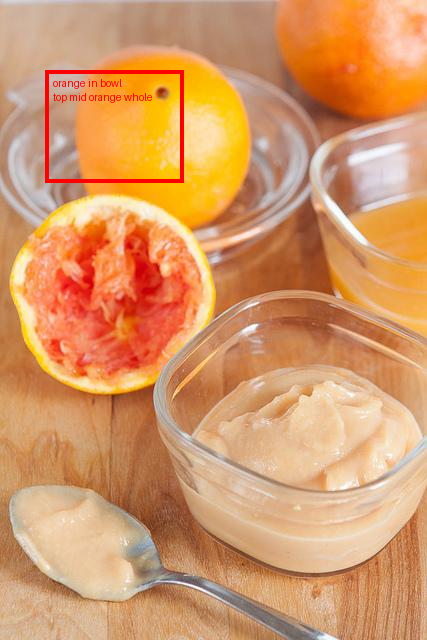

[100.67 379.69 379.33 146.69]


2. Prompt:stove
stove top
stove top


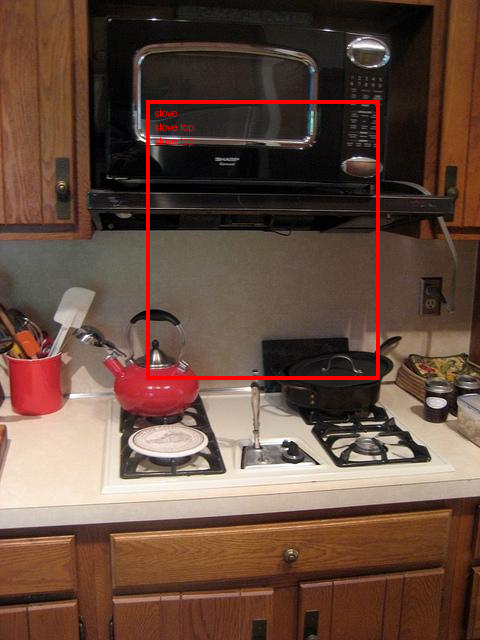

[106.79   2.16 155.32  93.84]


3. Prompt:top edge, 3rd donut from right
portion of donut at top left of center


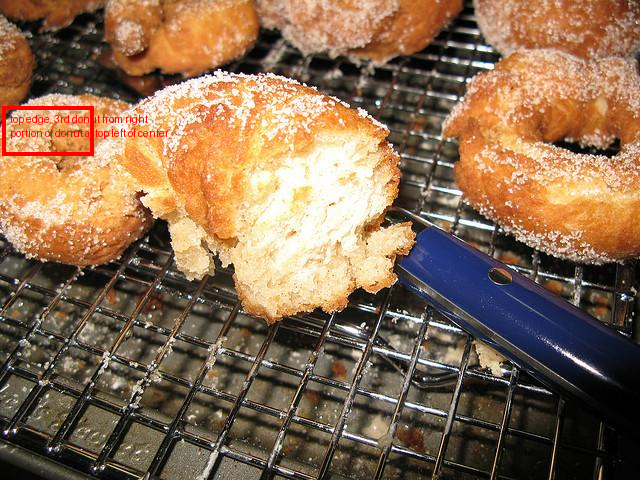

[203.34   3.24 198.66 164.7 ]


4. Prompt:dog face on the right
dog closest to us
dog on right


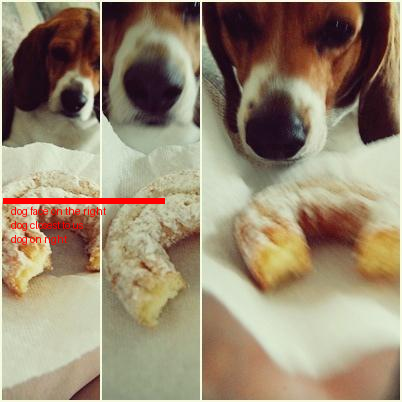

[  0.96   6.72 267.71 414.52]


5. Prompt:pink umbrella - bright
bright pink umbrella
bright pink umbrella on left


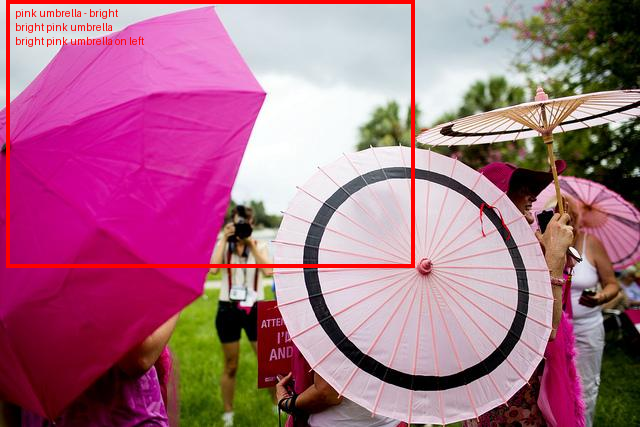

[133.98  56.05 185.24  94.41]


6. Prompt:third row far right behind the first two rows
Right column 3rd donut
THIRD DONUT FROM BOTTOM ON RIGHT


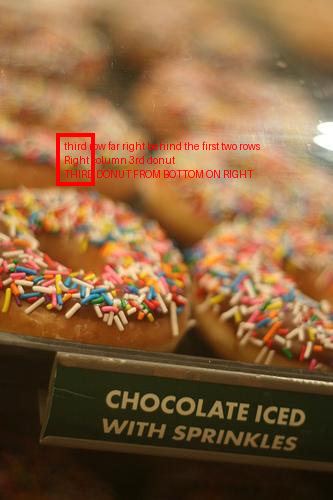

[204.39 220.9  379.87 145.55]


7. Prompt:the sheep in front
front lamb
goat on right


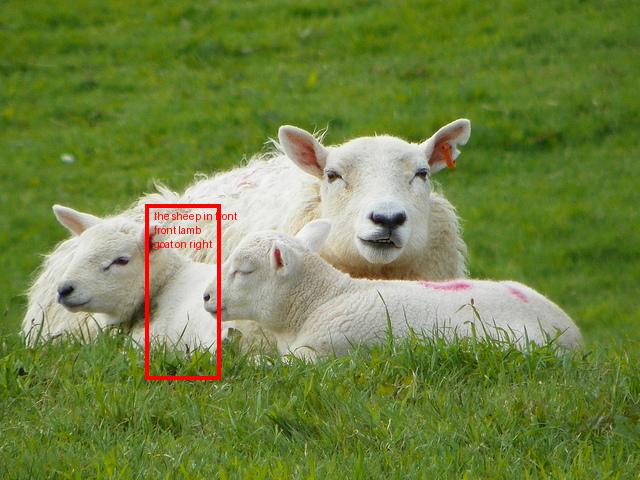

[ 81.55 190.97 557.42 282.84]


8. Prompt:front sheep
sheep looking right at camera
sheep looking at you :)


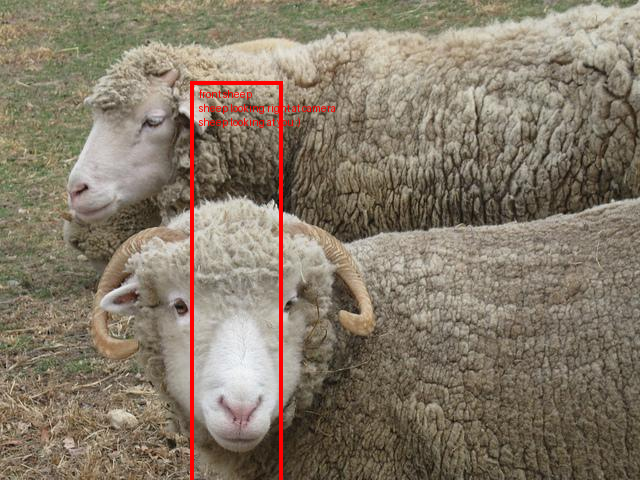

[282.74 137.85 248.86  95.01]


9. Prompt:pizza on the right
right pizza
pizza on right back


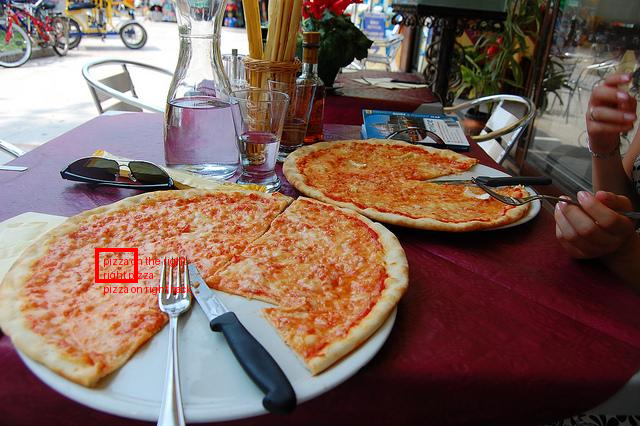

[261.03 140.93 238.04 249.05]


10. Prompt:right dog
RIGHT HOTDOG
dog on right


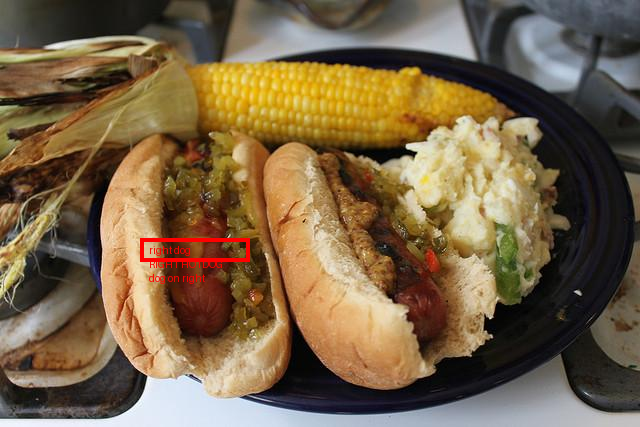

[496.18 230.83 121.89 154.25]


11. Prompt:front of train second from right
number two train
2nd train from right


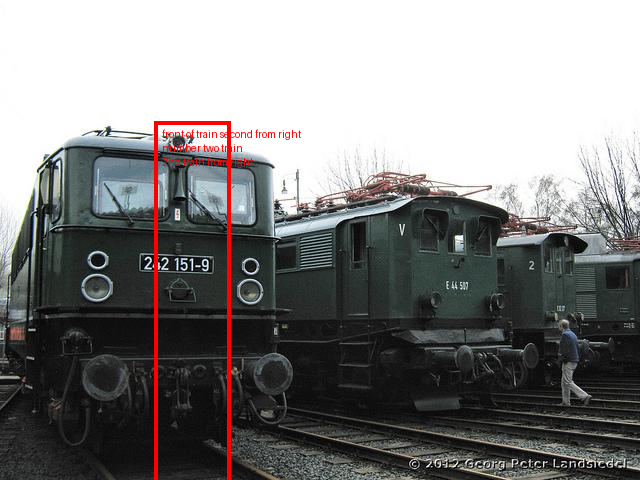

[321.43 355.87  86.1  186.55]


12. Prompt:tall gray vase holding flowers
metal vase
TALL VASE


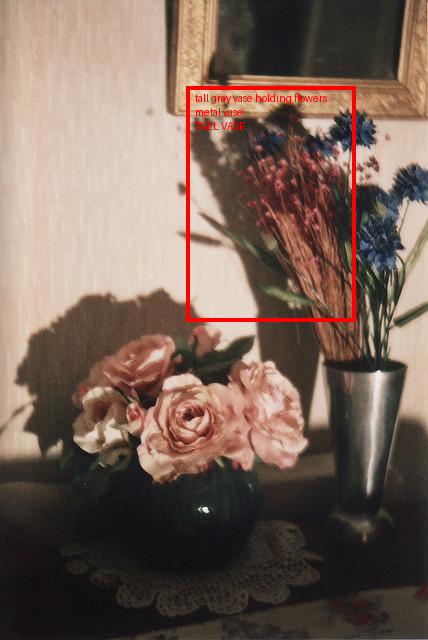

[364.39  28.9  231.22 170.33]


13. Prompt:dog at top of picture
dog on right
topmost animal


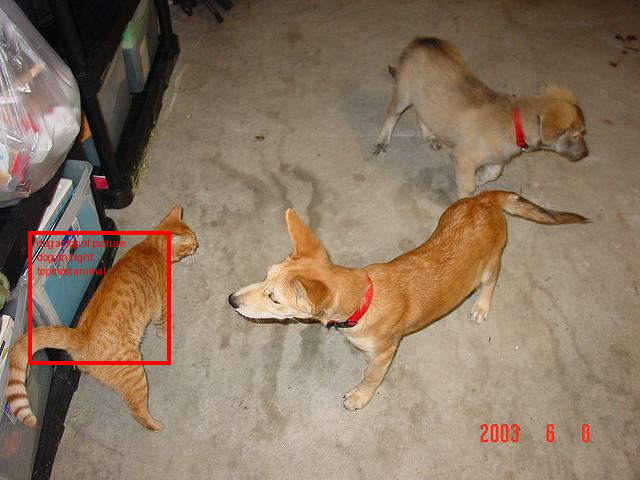

[  0.    70.99 155.68 173.18]


14. Prompt:green apple on the left
let green apple
apple far left


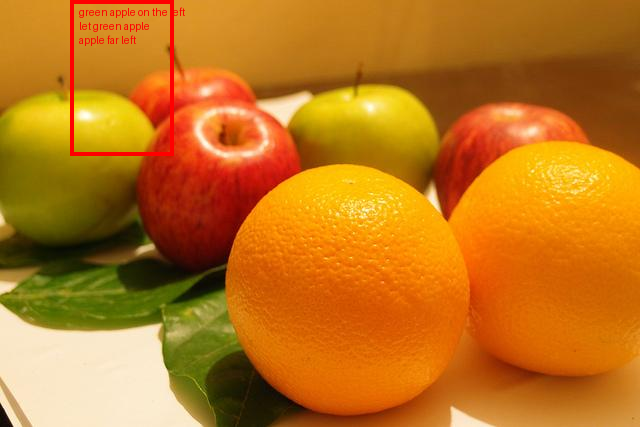

[ 74.79 454.47 199.91 178.34]


15. Prompt:bike in front/bottom of screen
front moto
close bike


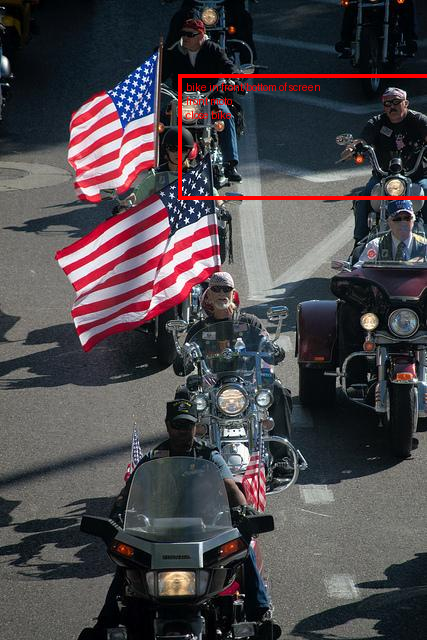

[464.55 287.38 175.11 184.38]


16. Prompt:couch on right side
right couch not pillows


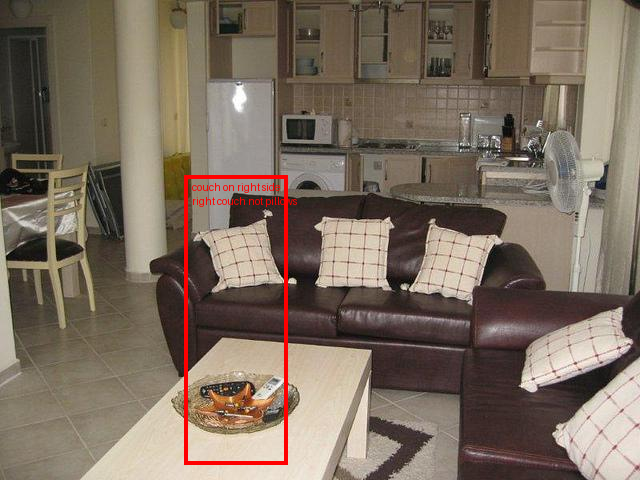

[ 73.89 217.45 249.67 184.2 ]


17. Prompt:motorcycle, second from bottom
2nd bike from front
2nd bike


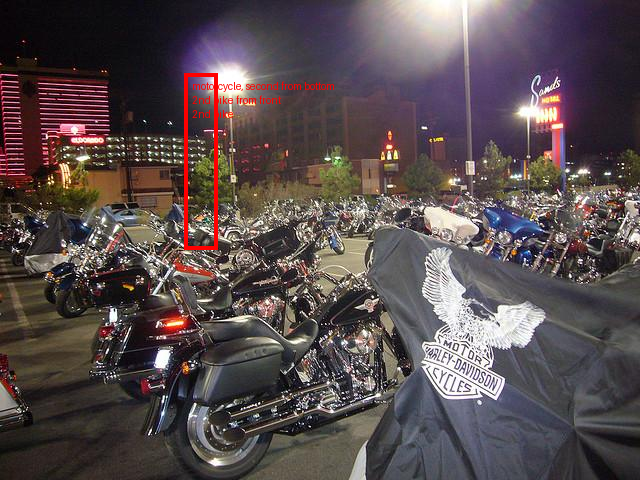

[232.87   0.   391.18 180.4 ]


18. Prompt:top mama sheep, the one whose back is being cut out of pic
top right sheep bending down to baby
standing tan cow with white head and brown ears


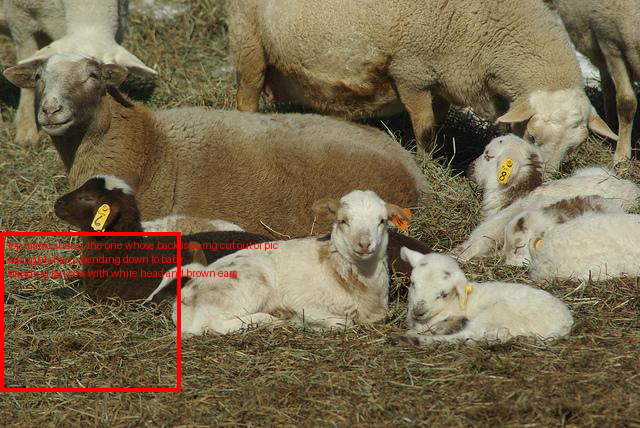

[257.8   63.46 106.78 133.75]


19. Prompt:top row third from left
top row, third from left
top row, 3rd donut from left


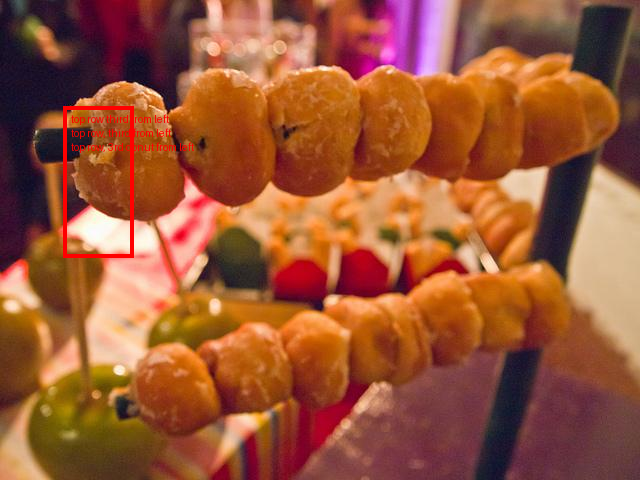

[179.13 421.59 256.97 169.14]


20. Prompt:closest airplane blue nose
front plane
nose of plane


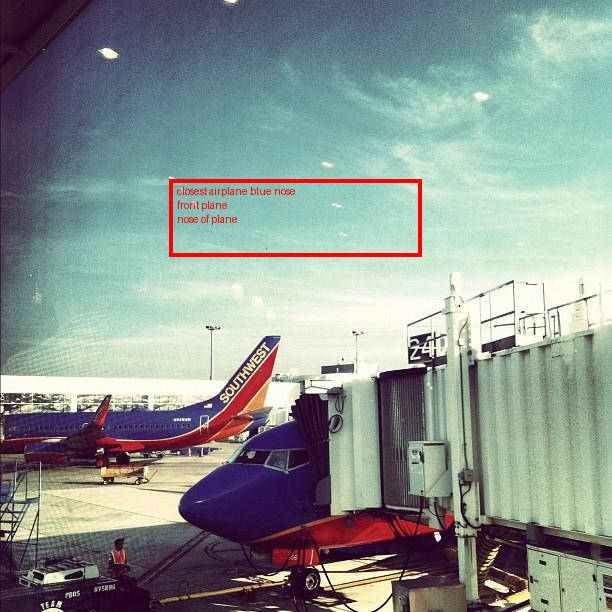

In [32]:

for idx in range(20):
    image_path = df["image"][idx]
    response = f'{df["bbox"][idx]}'
    
    print(response)

    # input_width = df["width"][idx]
    # input_height = df["height"][idx]
    
    caption = df["answer"][idx]
    caption = '\n'.join(caption)

    image = Image_PIL.open(image_path)
    print(f"\n\n{idx+1}. Prompt:{caption}")
    plot_bounding_boxes(image,response,caption)
